In this notebook, we evaluate the AutoEncoder at different ADC ranges

In [1]:
import sys
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras 
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

In [2]:
wireplane = 'U'
np.random.seed(42)

def filter_signal_ADC(data, clean_data, adc_value, filter_by_max):
    data_wf = []
    clean_wf = []
    for i in range(clean_data.shape[0]):
        if filter_by_max:
            if max(clean_data[i]) < adc_value or sum(clean_data[i]) == 0:
                data_wf.append(data[i])
                clean_wf.append(clean_data[i])
        else:
            if max(clean_data[i]) > adc_value or sum(clean_data[i]) == 0:
                data_wf.append(data[i])
                clean_wf.append(clean_data[i])
    data_wf = np.array(data_wf)
    clean_wf = np.array(clean_wf)
    return data_wf, clean_wf

Load testing set

In [3]:
x_test = np.load('../processed_data/x_test_' + wireplane + '.npy')
y_test = np.load('../processed_data/y_test_AE_' + wireplane + '.npy')
mean = np.load('../latest_models/mean_' + wireplane + '_nu.npy')
std = np.load('../latest_models/scale_' + wireplane + '_nu.npy')

### DEBUG -- Finding ranges where there are signals

In [4]:
def combine_overlapping_ranges(ranges):
    # sort the original list in ascending order according to the first element in each sublist
    ranges = sorted(ranges, key=lambda x: x[0])

    # initialize the result list
    result = []

    # iterate over the sorted list and combine overlapping sublists
    for range in ranges:
        if result and range[0] <= result[-1][1]:
            # combine the current sublist with the previous one
            result[-1] = [min(range[0], result[-1][0]), max(range[1], result[-1][1])]
        else:
            # no overlap, so simply append the current sublist to the result
            result.append(range)

    return result

In [5]:
# takes single wave (array), and baseline (the value at which the wave is flat) and returns
# a list of ranges where there are signals waveforms
from scipy.signal import find_peaks
def find_peak_range(array):
    baseline = 0
    array = abs(array)
    # find the peaks
    peaks, _ = find_peaks(array)
    peak_ranges = []
    start_spc = 0
    end_spc = 0

    if abs(array[0]) > baseline:
        end_spc = 0
        while end_spc < 200 and ((array[end_spc] > baseline) or (array[end_spc] < baseline)):
            end_spc += 1

    for peak in peaks:
        if peak == end_spc:
            end = peak
            while end < 200 and array[end] > abs(baseline):
                end += 1
            if [start_spc, end] not in peak_ranges:
                peak_ranges.append([start_spc, end])

        else:
            start = peak
            while start > 0 and array[start] > abs(baseline):
                start -= 1
        
            end = peak
            while end < 200 and array[end] > abs(baseline):
                end += 1
            if [start, end] not in peak_ranges:
                peak_ranges.append([start, end])

    peak_ranges = combine_overlapping_ranges(peak_ranges)

    return peak_ranges

perform scan of dataset and see how many ranges are produced for each waveforms, then inpect wavefroms that have high numbers of seperate ranges

In [6]:
#num = 0
#for debug_wave in y_test:
#    if sum(np.array(debug_wave)) != 0:
#        range = find_peak_range(debug_wave, 0)
#        if len(range) > 3:
#            fig = plt.figure(figsize=(10,4))
#            plt.plot(debug_wave, label= str(range))
#            plt.legend(fontsize=12)
#            filename = 'scan-ranges/scan_'+str(num)+'.png'
#            plt.savefig(filename, facecolor='w')
#    num+=1

        

In [7]:
#for num in range(100):
#    debug_wave = y_test[num]
#    if sum(np.array(debug_wave)) != 0:
#        fig = plt.figure(figsize=(10,4))
#        plt.plot(debug_wave, label= str(find_peak_range(debug_wave)))
#        plt.legend(fontsize=12)
#        filename = 'ranges/combine_phase1_'+str(num)+'.png' 
#        plt.savefig(filename, facecolor='w')
#        plt.close()

create a "soft bound" where if two ranges that are detected as signal are "close enough" within those bounds, merge them

In [8]:
def merge_ranges(wave, bound):
    # range_b1 is the ranges after merging using bound = 1
    range_b1 = find_peak_range(wave)
    idx = 0
    while idx < len(range_b1) - 1:
        if range_b1[idx][1] + bound >= range_b1[idx+1][0]:
            range_b1[idx][1] = max(range_b1[idx][1], range_b1[idx+1][1])
            del range_b1[idx+1]
        else:
            idx += 1
    return range_b1

In [9]:
#for num in range(100):
#    debug_wave = y_test[num]
#    if sum(np.array(debug_wave)) != 0:
#        fig = plt.figure(figsize=(10,4))
#        plt.plot(debug_wave, label= str(merge_ranges(debug_wave, 5)))
#        plt.legend(fontsize=12)
#        filename = 'ranges/combine_phase2_'+str(num)+'.png' 
#        plt.savefig(filename, facecolor='w')
#        plt.close()

#### Get all the ranges where there are signals

In [10]:
ranges = []
for wave in y_test:
    ranges.append(merge_ranges(wave, 5))

In [11]:
print(y_test.shape[0], len(ranges))

100000 100000


### DEBUG -- Finding ranges where there are signals - DEBUG DONE!

In [12]:
x_test_scaled = (x_test-mean)/std

In [13]:
y_test_scaled = []
for i in range(len(y_test)):
    if sum(y_test[i]) == 0:
        y_test_scaled.append(y_test[i])
    else:
        scaled = (y_test[i]-mean)/std
        y_test_scaled.append(scaled)
y_test_scaled = np.array(y_test_scaled)


Load trained model

In [14]:
autoencoder = load_model('../latest_models/model_AE_' + wireplane + 'plane_nu.h5')

In [15]:
autoencoder.evaluate(x_test_scaled, y_test_scaled, batch_size=4096)

25/25 [==============================] - 2s 7ms/step - loss: 0.0611


0.06110098212957382

### let's see what the MSE is at the region where signal exists

In [16]:
%%time
predictions = autoencoder.predict(x_test_scaled, batch_size=4096)
predictions = predictions.reshape(predictions.shape[0], predictions.shape[1])

25/25 [==============================] - 0s 5ms/step
Wall time: 357 ms


Plot predicted wave on top of target and input

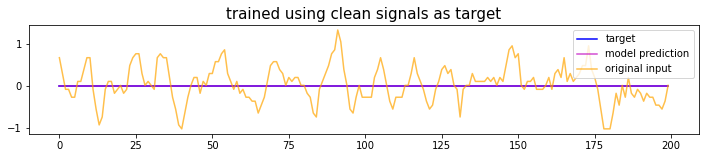

0.00948425568640232
1.8626451e-09


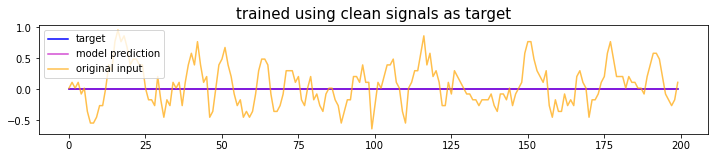

0.00948425568640232
1.8626451e-09


In [17]:
for idx in range(2):
    fig, (ax1) = plt.subplots(figsize=(12, 2), facecolor='white')
    ax1.plot(y_test_scaled[idx],color='blue', label='target')
    ax1.plot(predictions[idx],color='m',alpha=0.7, label='model prediction')
    ax1.plot(x_test_scaled[idx], color='orange',alpha=0.7, label = 'original input')
    ax1.set_title("trained using clean signals as target", fontsize=15)
    ax1.legend()
    

    plt.show()
    print(sum(predictions[idx])/len(predictions[idx]))
    print(predictions[idx].std())

Checkpoint reached

In [18]:
# calculate MSE for the entire range
mse = np.mean((y_test_scaled - predictions)**2)
print("MSE for entire range:", mse)

MSE for entire range: 0.06110097817454312


### DEBUG -- Calculate MSE with new ranges

In [19]:
# helper to calculate mse of segments or full wave
def calculate_single_mse_helper(seqment_wave, seqment_pred_wave):
    single_mse = np.mean((seqment_wave-seqment_pred_wave)**2)
    return single_mse

In [32]:
def calculate_single_mse(expected, prediction, wave_ranges):
    print(str(wave_ranges))
    mse = 0
    print("full window :", calculate_single_mse_helper(expected, prediction))
    if sum(expected) == 0:
        mse = calculate_single_mse_helper(expected, prediction)
    else:
        expected_waves = []
        pred_waves = []
        mses = []

        for range_ in wave_ranges:
            expected_wave = expected[range_[0]:range_[1]]
            pred_wave = prediction[range_[0]:range_[1]]
            curr_mse = calculate_single_mse_helper(expected_wave, pred_wave)
            mses.append(curr_mse)
            print("signal region: ", curr_mse)
            
        mse = sum(mses)
        print("sum: ", mse)
    return mse 

In [33]:
index = 5
ex = y_test_scaled[index]
pred = predictions[index]
rng = ranges[index]

[[22, 44]]
full window : 0.00786302778227905
signal region:  0.06919157527527206
sum:  0.06919157527527206
0.06919157527527206


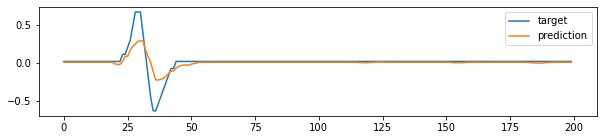

In [34]:

print(calculate_single_mse(ex, pred, rng))
fig = plt.figure(figsize=(10,2))
plt.plot(ex, label="target")
plt.plot(pred, label="prediction")
plt.legend()
plt.show()

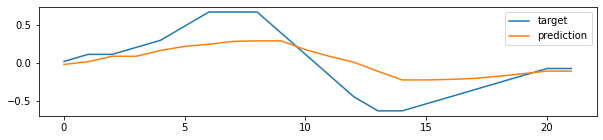

0.06919157527527206


In [35]:

tes_ex = ex[rng[0][0]:rng[0][1]]
tes_pred = pred[rng[0][0]:rng[0][1]]
fig = plt.figure(figsize=(10,2))
plt.plot(tes_ex, label="target")
plt.plot(tes_pred, label="prediction")
plt.legend()
plt.show()
print(calculate_single_mse_helper(tes_ex, tes_pred))

In [36]:
test_set_MSES = []
for i in range(len(ranges)):
    ex = y_test_scaled[i]
    pred = predictions[i]
    rng = ranges[i]
    wave_mse = calculate_single_mse(ex, pred, rng)
    test_set_MSES.append(wave_mse)


[]
full window : 8.995110592505476e-05
[]
full window : 8.995110592505476e-05
[]
full window : 8.995110592505476e-05
[]
full window : 8.995110592505476e-05
[]
full window : 0.00012446921346438863
[[22, 44]]
full window : 0.00786302778227905
signal region:  0.06919157527527206
sum:  0.06919157527527206
[]
full window : 8.995110592505476e-05
[[97, 179]]
full window : 0.1674207415647814
signal region:  0.4079431678296702
sum:  0.4079431678296702
[[44, 130], [163, 166]]
full window : 0.04422122857625314
signal region:  0.10252453535637965
signal region:  0.004625266797661758
sum:  0.10714980215404141
[]
full window : 8.70558797335949e-05
[[110, 149]]
full window : 0.047123540505578924
signal region:  0.23420106314502684
sum:  0.23420106314502684
[[87, 113], [122, 171]]
full window : 0.01880950705526375
signal region:  0.02146623524006986
signal region:  0.06290801281380928
sum:  0.08437424805387914
[]
full window : 8.995110592505476e-05
[]
full window : 8.995110592505476e-05
[]
full window

In [37]:
len(test_set_MSES)

100000

In [40]:
np.mean(test_set_MSES)

0.17030163966722658

### DEBUG -- Calculate MSE with new ranges --- DONE

### NEW TASK: calculate MSE for entire window AND MSE for regions where there are no signals

In [41]:
# work on next

### BELOW -- NEED TO LOOK AT AGAIN

Next: at the moment MSEs are being calculating for just one range. However there are waves with multiple ranges. We need to take this into account

In [ ]:
print(calculate_single_mse(x_test_scaled[0], predictions[15]))

NOTE: MSE IS CALCULATED FOR ONE WAVE. NEED TO LOOP TO GET ALL WAVES

In [ ]:
# adc_max = 0 means no max cut is applied
def eval_cut_(x_test_, y_test_, adc_min, adc_max):
    print(x_test_.shape, y_test_.shape)

    test_, clean_ =  filter_signal_ADC(x_test_, y_test_, adc_min, False)
    print(test_.shape, clean_.shape)
    if adc_max != 0:
        test_, clean_ =  filter_signal_ADC(test_, clean_, adc_max, True)
    print(test_.shape, clean_.shape)


    x_test_scaled_ = (x_test_-mean)/std
    clean_scaled_ = clean_
    
    y_test_scaled_ = []
    for i in range(len(y_test_)):
        if sum(y_test_[i]) == 0:
            y_test_scaled_.append(y_test_[i])
        else:
            scaled_ = (y_test_[i]-mean)/std
            y_test_scaled_.append(scaled_)
    y_test_scaled_ = np.array(y_test_scaled_)


    all_pred = autoencoder.predict(x_test_scaled, batch_size=4096)
    all_pred = all_pred.reshape(all_pred.shape[0], all_pred.shape[1])

    MSES_ = []
    nan_idxs_ = []
    for idx in range(len(y_test_scaled)):
        mse_ = calculate_single_mse(y_test_scaled[idx], all_pred[idx])

        if not np.isnan(mse_):
            MSES.append(mse_)
        else:
            nan_idxs_.append(idx)
    return MSES, nan_idxs_

In [ ]:
mse_3_15 = []
nans_3_15 = []
for i in range(3, 16):
    eval_cut_(x_test, y_test, i, 0)
    mses_, nans = eval_cut_(x_test, y_test, i, 0)
    mse_3_15.append([mses_])
    nans_3_15.append([nans])


In [ ]:
print(len(mse_3_15), len(nans_3_15))

In [ ]:
mse_3_15